# **Exploratory Data Analysis on COVID-19**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import requests
from io import StringIO
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"
from plotly.subplots import make_subplots
from datetime import timedelta

# ... (Previous code for data download remains the same) ...

def clean_covid_data(confirmed, deaths, recovered):
    """Cleans the COVID-19 data."""
    # Combine dataframes
    covid_data = prepare_data(confirmed, deaths, recovered)

    # Handle missing values
    covid_data.fillna(0, inplace=True)  # Replace missing values with 0

    # Convert data types if necessary
    covid_data['Confirmed'] = covid_data['Confirmed'].astype(int)
    covid_data['Deaths'] = covid_data['Deaths'].astype(int)
    covid_data['Recovered'] = covid_data['Recovered'].astype(int)
    # ... (Add other data type conversions as needed) ...

    return covid_data

# ... (Rest of your code remains the same) ...

# Main execution
# print("Downloading COVID-19 data...")
# confirmed, deaths, recovered = get_covid_data()

# print("Cleaning data...")
# covid_data = clean_covid_data(confirmed, deaths, recovered) # Call the cleaning function here

# ... (Rest of your code for analysis and visualization) ...

## Global Trend of Covid 19 Data(Confirmed, Active, Deaths, Recoverd)
## Top 10 Countries with most confirmed Cases

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

# Download latest COVID-19 data from JHU CSSE GitHub repository
def get_covid_data():
    # URLs for different datasets
    confirmed_url = "https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv"
    deaths_url = "https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv"
    recovered_url = "https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv"

    # Download data
    confirmed = pd.read_csv(confirmed_url)
    deaths = pd.read_csv(deaths_url)
    recovered = pd.read_csv(recovered_url)

    return confirmed, deaths, recovered

def prepare_data(confirmed, deaths, recovered):
    # Melt the dataframes to convert dates from columns to rows
    conf_melted = confirmed.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'],
                               var_name='Date', value_name='Confirmed')
    deaths_melted = deaths.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'],
                              var_name='Date', value_name='Deaths')
    rec_melted = recovered.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'],
                              var_name='Date', value_name='Recovered')

    # Merge all dataframes
    covid_data = conf_melted.merge(deaths_melted, on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long'])
    covid_data = covid_data.merge(rec_melted, on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long'])

    # Convert date column
    covid_data['Date'] = pd.to_datetime(covid_data['Date'])

    # Filter data from 2020 to August 3rd, 2021
    covid_data = covid_data[(covid_data['Date'] >= '2020-01-01') & (covid_data['Date'] <= '2021-08-4')]

    return covid_data

def create_global_summary(covid_data):
    # Group by date and sum cases
    global_summary = covid_data.groupby('Date').sum().reset_index()
    global_summary['Active'] = global_summary['Confirmed'] - global_summary['Deaths'] - global_summary['Recovered']
    global_summary['Death_Rate'] = (global_summary['Deaths'] / global_summary['Confirmed'] * 100).round(2)
    global_summary['Recovery_Rate'] = (global_summary['Recovered'] / global_summary['Confirmed'] * 100).round(2)

    return global_summary

def plot_global_trends(global_summary):
    # Create subplots
    fig = go.Figure()

    # Add traces
    fig.add_trace(go.Scatter(x=global_summary['Date'], y=global_summary['Confirmed'],
                            mode='lines', name='Confirmed Cases',
                            line=dict(color='blue', width=2)))

    fig.add_trace(go.Scatter(x=global_summary['Date'], y=global_summary['Active'],
                            mode='lines', name='Active Cases',
                            line=dict(color='orange', width=2)))

    fig.add_trace(go.Scatter(x=global_summary['Date'], y=global_summary['Recovered'],
                            mode='lines', name='Recovered Cases',
                            line=dict(color='green', width=2)))

    fig.add_trace(go.Scatter(x=global_summary['Date'], y=global_summary['Deaths'],
                            mode='lines', name='Deaths',
                            line=dict(color='red', width=2)))

    # Update layout
    fig.update_layout(title='Global COVID-19 Trends (2020 - August 2021)',
                     xaxis_title='Date',
                     yaxis_title='Number of Cases',
                     hovermode='x unified',
                     template='plotly_white')

    return fig

def plot_top_countries(covid_data, n=10):
    # Get latest date
    latest_date = covid_data['Date'].max()

    # Get top countries by confirmed cases
    top_countries = covid_data[covid_data['Date'] == latest_date].groupby('Country/Region')['Confirmed'].sum()\
                            .sort_values(ascending=False).head(n)

    # Create bar plot
    fig = px.bar(x=top_countries.index, y=top_countries.values,
                 title=f'Top {n} Countries by Confirmed Cases (as of {latest_date.date()})',
                 labels={'x': 'Country', 'y': 'Confirmed Cases'},
                 template='plotly_white')

    return fig

def calculate_statistics(covid_data):
    # Get latest date statistics
    latest_date = covid_data['Date'].max()
    latest_stats = covid_data[covid_data['Date'] == latest_date].select_dtypes(include=np.number).sum() # Select only numerical columns for sum

    stats = {
        'Total Confirmed': latest_stats['Confirmed'],
        'Total Deaths': latest_stats['Deaths'],
        'Total Recovered': latest_stats['Recovered'],
        'Active Cases': latest_stats['Confirmed'] - latest_stats['Deaths'] - latest_stats['Recovered'],
        'Death Rate': (latest_stats['Deaths'] / latest_stats['Confirmed'] * 100).round(2),
        'Recovery Rate': (latest_stats['Recovered'] / latest_stats['Confirmed'] * 100).round(2)
    }

    return stats

# Main execution
print("Downloading COVID-19 data...")
confirmed, deaths, recovered = get_covid_data()

print("Preparing data...")
covid_data = prepare_data(confirmed, deaths, recovered)
global_summary = create_global_summary(covid_data)

print("\nGlobal COVID-19 Statistics (2020 - August 2021):")
stats = calculate_statistics(covid_data)
for key, value in stats.items():
    print(f"{key}: {value:,.2f}")

print("\nGenerating visualizations...")
trend_fig = plot_global_trends(global_summary)
countries_fig = plot_top_countries(covid_data)

# Display plots
trend_fig.show()
countries_fig.show()


Preparing data...


<ipython-input-1-f3d9f9642e32>:34: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  covid_data['Date'] = pd.to_datetime(covid_data['Date'])



Global COVID-19 Statistics (2020 - August 2021):
Total Confirmed: 199,152,496.00
Total Deaths: 4,252,897.00
Total Recovered: 129,357,529.00
Active Cases: 65,542,070.00
Death Rate: 2.14
Recovery Rate: 64.95

Generating visualizations...


## Find the Global Fatality rate

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# ... (Previous code for data download and preparation remains the same) ...

def calculate_global_fatality_rate(covid_data, start_date, end_date):
    """Calculates the global fatality rate for a given time range."""
    filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]
    total_deaths = filtered_data['Deaths'].sum()
    total_confirmed = filtered_data['Confirmed'].sum()
    fatality_rate = (total_deaths / total_confirmed) * 100
    return fatality_rate

def plot_global_fatality_rate(fatality_rate, start_date, end_date):
    """Plots the global fatality rate in a gauge chart."""
    fig = go.Figure(go.Indicator(
        mode="gauge+number",
        value=fatality_rate,
        domain={'x': [0, 1], 'y': [0, 1]},
        title={'text': f"Global COVID-19 Fatality Rate (%)\n({start_date} to {end_date})"},
        gauge={
            'axis': {'range': [None, 10]},  # Adjust range as needed
            'steps': [
                {'range': [0, 2], 'color': "lightgreen"},
                {'range': [2, 4], 'color': "yellow"},
                {'range': [4, 10], 'color': "red"}
            ],
            'threshold': {
                'line': {'color': "black", 'width': 4},
                'thickness': 0.75,
                'value': fatality_rate
            }
        }
    ))
    fig.show()

# Define the date range for 2020 to 2021
start_date = '2020-01-01'
end_date = '2021-08-03'

# Calculate and plot global fatality rate for 2020-2021
global_fatality_rate = calculate_global_fatality_rate(covid_data, start_date, end_date)
print(f"\nGlobal COVID-19 Fatality Rate (2020-2021): {global_fatality_rate:.2f}%")
plot_global_fatality_rate(global_fatality_rate, start_date, end_date)



Global COVID-19 Fatality Rate (2020-2021): 2.38%


## Spread of COVID-19 Confirmed Cases Around the World by using choropleth Graph

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

# ... (Previous code for data download and preparation remains the same) ...

def plot_covid_spread(covid_data, start_date, end_date):
    """Plots the spread of COVID-19 confirmed cases around the world for a specific time range."""
    # Filter data for the specified date range
    filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]

    fig = px.choropleth(
        filtered_data,
        locations="Country/Region",
        locationmode="country names",
        color="Confirmed",  # Use 'Confirmed' column for color encoding
        animation_frame="Date",  # Animate over time using 'Date' column
        color_continuous_scale="OrRd",  # Diverging orange-red color scale
        range_color=[0, filtered_data["Confirmed"].max()],  # Set color range based on confirmed cases
        hover_name="Country/Region",
        hover_data={"Confirmed": True, "Deaths": True, "Recovered": True},
        title=f"Spread of COVID-19 Confirmed Cases Around the World ({start_date} to {end_date})"
    )

    fig.update_layout(
        geo=dict(
            showframe=False,
            showcoastlines=False,
            projection_type='equirectangular'
        )
    )

    fig.show()

# Define the date range for 2020 to August 3rd, 2021
start_date = '2020-01-01'
end_date = '2021-08-03'

# Plot the spread of COVID-19 confirmed cases for the specified date range
plot_covid_spread(covid_data, start_date, end_date)


## Spread of COVID-19 Deaths Around the World using choropleth

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px

# ... (Previous code for data download and preparation remains the same) ...

def plot_covid_deaths_spread(covid_data, start_date, end_date):
    """Plots the spread of COVID-19 deaths around the world for a specific time range."""
    # Filter data for the specified date range
    filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]

    fig = px.choropleth(
        filtered_data,
        locations="Country/Region",
        locationmode="country names",
        color="Deaths",  # Use 'Deaths' column for color encoding
        animation_frame="Date",  # Animate over time using 'Date' column
        color_continuous_scale="OrRd",  # Diverging orange-red color scale
        range_color=[0, filtered_data["Deaths"].max()],  # Set color range based on deaths
        hover_name="Country/Region",
        hover_data={"Confirmed": True, "Deaths": True, "Recovered": True},
        title=f"Spread of COVID-19 Deaths Around the World ({start_date} to {end_date})"
    )

    fig.update_layout(
        geo=dict(
            showframe=False,
            showcoastlines=False,
            projection_type='equirectangular'
        )
    )

    fig.show()


# Define the date range for 2020 to August 3rd, 2021
start_date = '2020-01-01'
end_date = '2021-08-03'

# Plot the spread of COVID-19 deaths for the specified date range
plot_covid_deaths_spread(covid_data, start_date, end_date)


## Find the top 50 Countries fatality rate

In [ ]:
import pandas as pd

def get_top_50_countries_data(covid_data, start_date, end_date):
    """Extracts data for the top 50 countries with the most confirmed cases within a specific date range."""
    # Filter data for the specified date range
    filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]

    # Get the latest data in the specified range
    latest_date = filtered_data['Date'].max()
    latest_data = filtered_data[filtered_data['Date'] == latest_date]

    # Group by country, sum confirmed cases, and sort
    country_data = latest_data.groupby('Country/Region')['Confirmed'].sum().sort_values(ascending=False).reset_index()

    # Select top 50 countries
    top_50_countries = country_data.head(50)

    # Merge with original data to get deaths and calculate fatality rate
    top_50_data = pd.merge(top_50_countries, latest_data[['Country/Region', 'Deaths']], on='Country/Region', how='left')
    top_50_data = top_50_data.groupby('Country/Region').sum().reset_index()  # Group and sum to get correct death counts
    top_50_data['Fatality Rate'] = top_50_data.apply(
        lambda row: round((row['Deaths'] / row['Confirmed']) * 100, 2) if row['Confirmed'] > 0 else 0, axis=1
    )

    return top_50_data

def highlight_country_data(country_data):
    """Highlights country data based on fatality rate."""
    def color_cell(val):
        """Applies color based on fatality rate value."""
        if val > 5:
            color = 'red'  # High fatality rate
        elif val > 2:
            color = 'orange'  # Moderate fatality rate
        else:
            color = 'green'  # Low fatality rate
        return f'background-color: {color}'

    styled_data = country_data.style.applymap(color_cell, subset=['Fatality Rate'])
    return styled_data


# Define the date range for 2020 to August 3rd, 2021
start_date = '2020-01-01'
end_date = '2021-08-03'

# Get and highlight top 50 countries data for the specified date range
top_50_data = get_top_50_countries_data(covid_data, start_date, end_date)
highlighted_data = highlight_country_data(top_50_data)

# Display the highlighted table
from IPython.display import display
display(highlighted_data)


<ipython-input-19-c3231d0f930e>:39: FutureWarning:

Styler.applymap has been deprecated. Use Styler.map instead.



,Country/Region,Confirmed,Deaths,Fatality Rate
0,Argentina,4961880,106447,2.150000
1,Austria,655553,13145,2.010000
2,Bangladesh,1296093,21397,1.650000
3,Belgium,1130758,25251,2.230000
4,Bolivia,475265,17882,3.760000
5,Brazil,19993870,558872,2.800000
6,Chile,1618457,35640,2.200000
7,Colombia,4807979,121216,2.520000
8,Czechia,1673926,30378,1.810000
9,Ecuador,489089,31694,6.480000


## Top 10 Deathly Countries Effected by Covid 19

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 9.0 MB/s eta 0:00:00


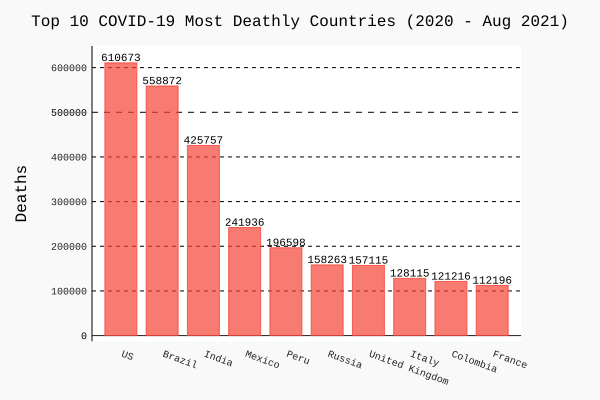

In [ ]:
!pip install pygal
import pygal
from pygal.style import DefaultStyle
from IPython.display import SVG

# Assuming 'covid_data' is your DataFrame containing COVID-19 data
# Filter data for the specific date range (2020 to 2021 August 3rd)
start_date = '2020-01-01'
end_date = '2021-08-03'
filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]

# Get the latest data within the filtered range
latest_date = filtered_data['Date'].max()
latest_data = filtered_data[filtered_data['Date'] == latest_date]

# Group by country to calculate total confirmed cases and deaths
country_data = latest_data.groupby('Country/Region')[['Confirmed', 'Deaths']].sum().reset_index()

# Identify the top 10 countries with the highest number of deaths
top10_country_deaths = country_data.sort_values('Deaths', ascending=False).head(10)

# Plot the top 10 countries with the highest deaths using pygal
chart_d = pygal.Bar(
    show_legend=False,
    human_readable=True,
    fill=True,
    width=600,
    height=400,
    x_label_rotation=20,
    print_values=True,
    print_values_position='top',
    style=DefaultStyle(value_font_size=11, value_colors=('black',))
)

chart_d.y_title = "Deaths"
chart_d.title = 'Top 10 COVID-19 Most Deathly Countries (2020 - Aug 2021)'  # Set chart title
chart_d.x_labels = [i for i in top10_country_deaths['Country/Region']]  # Label of country names
chart_d.add('Confirmed Deaths', top10_country_deaths['Deaths'])

# Render the chart and display it
display(SVG(chart_d.render(disable_xml_declaration=True)))


## Top 10 Countries with Highest Fatality Rate

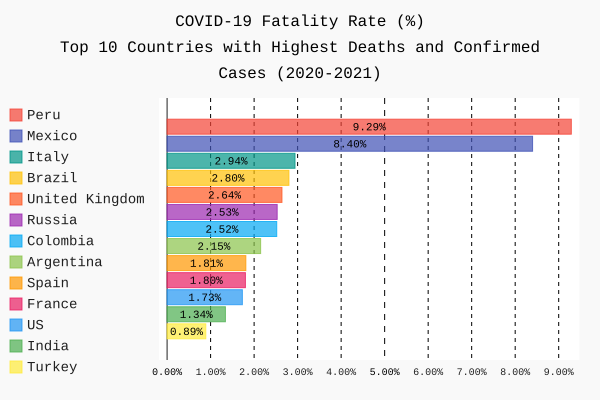

In [ ]:
import pygal
from pygal.style import DefaultStyle
from IPython.display import SVG

# Define the date range for filtering
start_date = '2020-01-01'
end_date = '2021-08-03'

# Filter the dataset for the specific date range
filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]

# Get the latest date within the filtered range
latest_date = filtered_data['Date'].max()
latest_data = filtered_data[filtered_data['Date'] == latest_date]

# Group by country to calculate total confirmed cases and deaths
country_data = latest_data.groupby('Country/Region')[['Confirmed', 'Deaths']].sum().reset_index()
country_data.rename(columns={"Confirmed": "Confirmed Cases", "Deaths": "Deaths"}, inplace=True)

# Get top 10 countries by confirmed cases
top10_country = country_data.sort_values('Confirmed Cases', ascending=False).head(10)

# Define fatality_rate function with rounding
def fatality_rate(deaths, confirmed):
    return round((deaths / confirmed) * 100, 2) if confirmed else 0

# Calculate fatality rate for top 10 countries with the highest confirmed cases
top10_country['fatality_rate'] = top10_country[['Confirmed Cases', 'Deaths']] \
    .apply(lambda row: fatality_rate(row["Deaths"], row["Confirmed Cases"]), axis=1)

# Calculate fatality rate for top 10 countries with the highest deaths
top10_country_deaths = country_data.sort_values('Deaths', ascending=False).head(10)
top10_country_deaths['fatality_rate'] = top10_country_deaths[['Confirmed Cases', 'Deaths']] \
    .apply(lambda row: fatality_rate(row["Deaths"], row["Confirmed Cases"]), axis=1)

# Combine data of countries with the highest confirmed cases and the highest deaths
df_country_top10 = pd.concat([top10_country_deaths, top10_country]).drop_duplicates().sort_values('fatality_rate',
                                                                                                 ascending=False)

##### PLOT HORIZONTAL BAR CHART TO DISPLAY FATALITY RATE ####
# Plot COVID-19 Fatality Rate for Top 10 Countries
chart_f = pygal.HorizontalBar(print_values=True, width=600,
                              height=400,  # Set chart configuration
                              style=DefaultStyle(value_font_size=11, value_colors=('black',)))
percent_formatter = lambda x: '{:.2f}%'.format(x)  # Format fatality rate in % with 2 decimal points
chart_f.value_formatter = percent_formatter
chart_f.title = "COVID-19 Fatality Rate (%)\nTop 10 Countries with Highest Deaths and Confirmed Cases (2020-2021)"  # Set chart title
for country, rate in zip(df_country_top10["Country/Region"],  # Add values to the chart
                         df_country_top10["fatality_rate"]):
    chart_f.add(country, rate)

# Render the chart and display it
display(SVG(chart_f.render(disable_xml_declaration=True)))


## Comparsion Between Two Countries(US and India)

In [ ]:
!pip install plotly
import plotly.graph_objects as go

def compare_countries(covid_data, country1, country2, start_date, end_date):
    """
    Compares the COVID-19 trends of two countries within a specific date range.

    Args:
        covid_data: The pandas DataFrame containing COVID-19 data.
        country1: The name of the first country.
        country2: The name of the second country.
        start_date: The start date of the range (YYYY-MM-DD).
        end_date: The end date of the range (YYYY-MM-DD).

    Returns:
        A plotly figure object.
    """

    # Filter data for the selected countries and date range
    filtered_data = covid_data[(covid_data['Date'] >= start_date) & (covid_data['Date'] <= end_date)]
    country1_data = filtered_data[filtered_data['Country/Region'] == country1]
    country2_data = filtered_data[filtered_data['Country/Region'] == country2]

    # Create the figure
    fig = go.Figure()

    # Add traces for confirmed cases
    fig.add_trace(go.Scatter(x=country1_data['Date'], y=country1_data['Confirmed'],
                             mode='lines', name=f'{country1} Confirmed'))
    fig.add_trace(go.Scatter(x=country2_data['Date'], y=country2_data['Confirmed'],
                             mode='lines', name=f'{country2} Confirmed'))

    # Add traces for deaths
    fig.add_trace(go.Scatter(x=country1_data['Date'], y=country1_data['Deaths'],
                             mode='lines', name=f'{country1} Deaths',
                             line=dict(dash='dash')))  # Dashed line for deaths
    fig.add_trace(go.Scatter(x=country2_data['Date'], y=country2_data['Deaths'],
                             mode='lines', name=f'{country2} Deaths',
                             line=dict(dash='dash')))

    # Update layout
    fig.update_layout(title=f'COVID-19 Comparison: {country1} vs. {country2} (2020-2021)',
                      xaxis_title='Date',
                      yaxis_title='Number of Cases',
                      hovermode='x unified',
                      template='plotly_white')

    return fig

# Example usage:
# Assuming 'covid_data' is your DataFrame
start_date = '2020-01-01'
end_date = '2021-08-03'
fig = compare_countries(covid_data, 'US', 'India', start_date, end_date)  # Replace with your desired countries
fig.show()


## Vaccination per 100(Continent Wise)

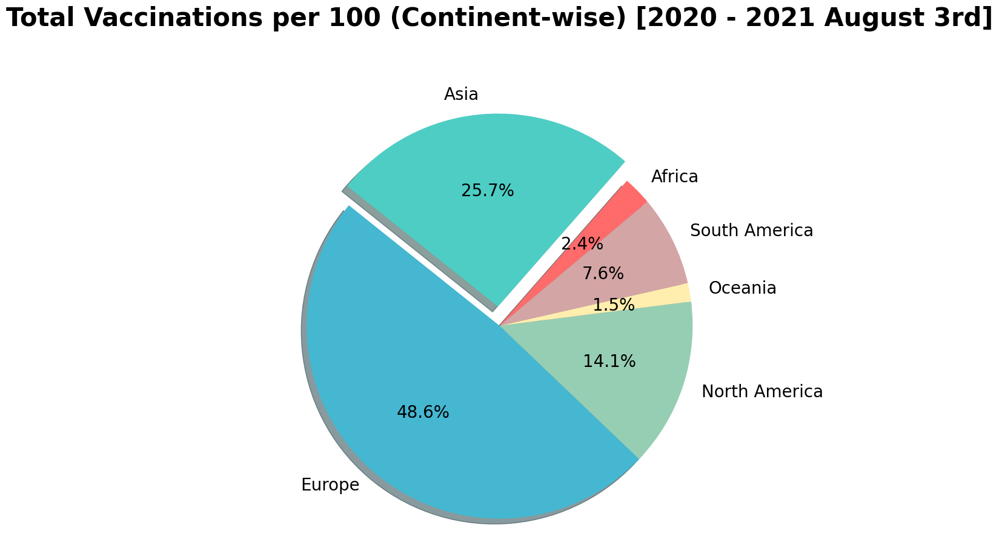

In [ ]:
import io
import requests
import pandas as pd
import matplotlib.pyplot as plt

# Fetch data from URL
url = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"
read_data = requests.get(url).content

# Create Pandas DataFrame
covid_data = pd.read_csv(io.StringIO(read_data.decode('utf-8')))

# Convert 'date' column to datetime
covid_data['date'] = pd.to_datetime(covid_data['date'])

# Filter data for the date range (2020 to 2021 August 3rd)
start_date = '2020-01-01'
end_date = '2021-08-03'
filtered_data = covid_data[(covid_data['date'] >= start_date) & (covid_data['date'] <= end_date)]

# Group by continent and sum only numerical columns
# Exclude 'date' column from the sum operation
df_con = filtered_data.groupby('continent', as_index=False).sum(numeric_only=True)

# Set figure size and font parameters
plt.rcParams['font.size'] = 40.0
fig1, ax1 = plt.subplots(figsize=(10, 10))  # Increased figure size to 20x20 inches

# Create explode tuple for slight separation of slices
explode = (0, 0.1, 0, 0, 0, 0)

# Create pie chart with larger size
ax1.pie(df_con['total_vaccinations_per_hundred'],
        labels=df_con['continent'],
        autopct='%1.1f%%',
        shadow=True,
        startangle=40,
        explode=explode,
        textprops={'fontsize': 20},
        colors=['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEEAD', '#D4A5A5'])

# Ensure pie chart is circular
ax1.axis('equal')

# Add title with padding
plt.title("Total Vaccinations per 100 (Continent-wise) [2020 - 2021 August 3rd]",
          pad=80,
          fontdict={'fontsize': 30, 'fontweight': 'bold'})

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()

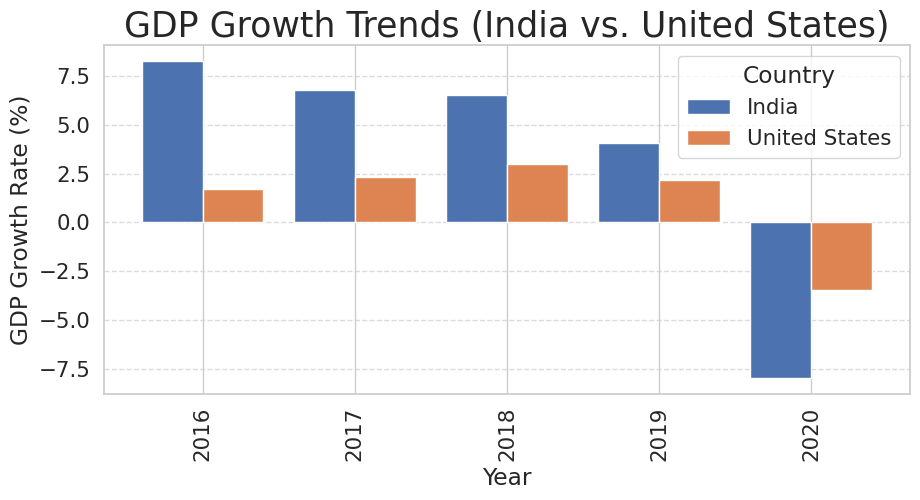

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("GDP.csv")

# Filter data for India and the United States
filtered_df = df[df['Country Name'].isin(['India', 'United States'])]

# Extract yearly data and transpose for easier plotting
yearly_data = filtered_df.set_index('Country Name').loc[:, '2016':'2020'].T
yearly_data.index = yearly_data.index.astype(int)  # Convert years to integers for better plotting

# Convert the data to numeric, handling errors
for column in yearly_data.columns:
    yearly_data[column] = pd.to_numeric(yearly_data[column], errors='coerce')

# Plot the bar graph
yearly_data.plot(kind='bar', figsize=(10, 6), width=0.8)

# Add labels, title, and legend
plt.xlabel('Year')
plt.ylabel('GDP Growth Rate (%)')
plt.title('GDP Growth Trends (India vs. United States)')
plt.legend(title='Country')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()